<a href="https://colab.research.google.com/github/qorganbek/ComputerVision-Spring-2024/blob/main/lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

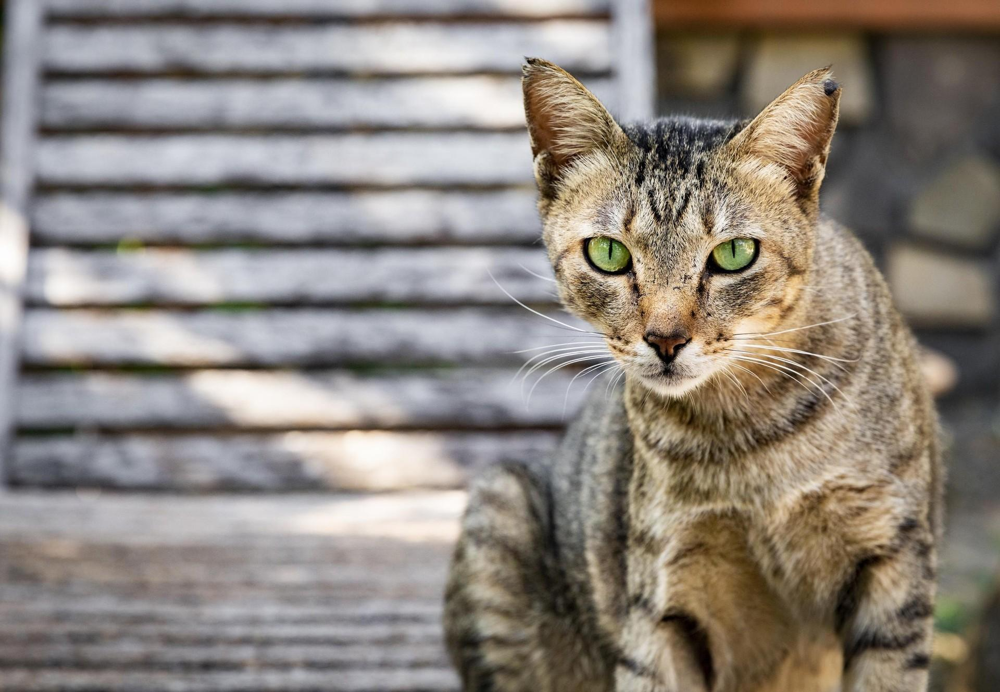

In [ ]:
url = 'https://media.4-paws.org/5/b/4/b/5b4b5a91dd9443fa1785ee7fca66850e06dcc7f9/VIER%20PFOTEN_2019-12-13_209-2890x2000-1920x1329.jpg'
image = io.imread(url)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_2 )

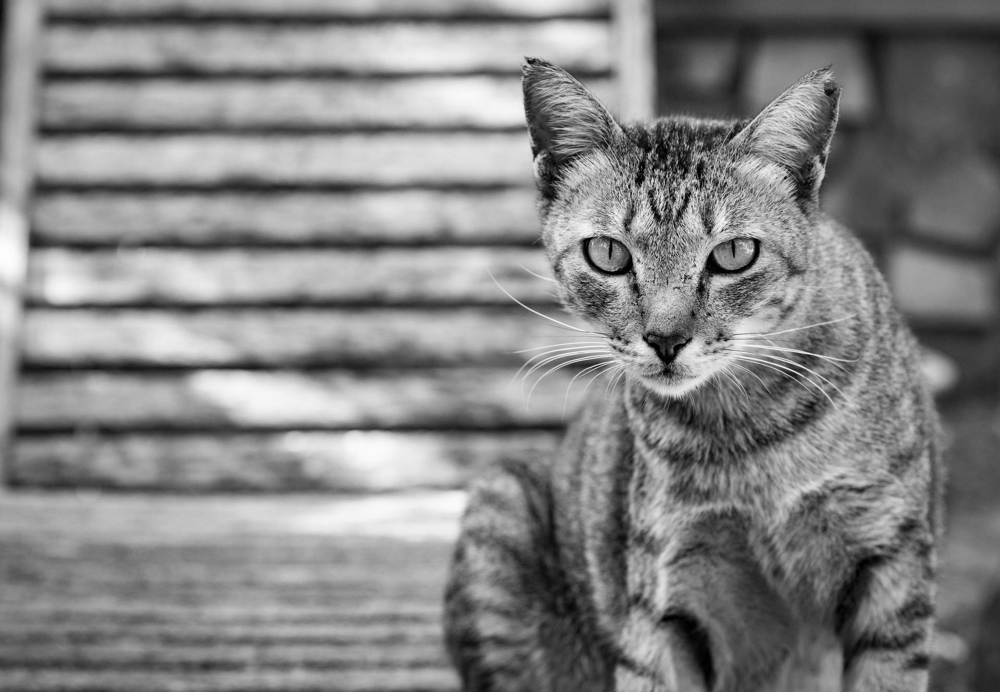

In [ ]:
image_3 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(image_3)

In [ ]:
b = image_2.copy()
# set green and red channels to 0
#RGB
b[:, :, 1] = 0
b[:, :, 2] = 0


g = image_2.copy()
# set blue and red channels to 0
g[:, :, 0] = 0
g[:, :, 2] = 0

r = image_2.copy()
# set blue and green channels to 0
r[:, :, 0] = 0
r[:, :, 1] = 0




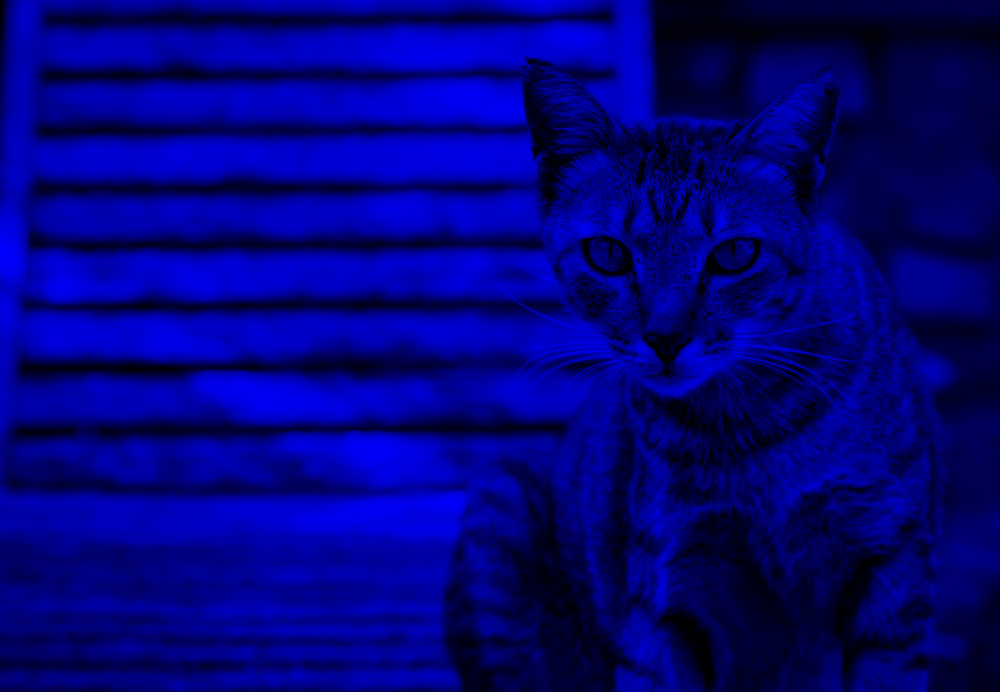

In [ ]:
cv2_imshow(b)

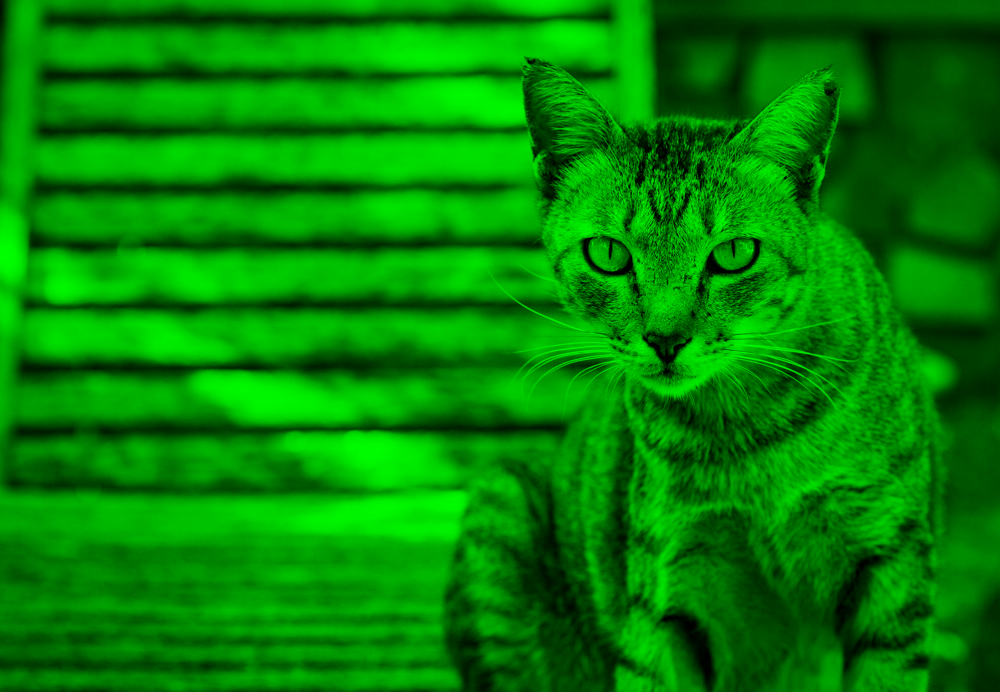

In [ ]:
cv2_imshow(g)



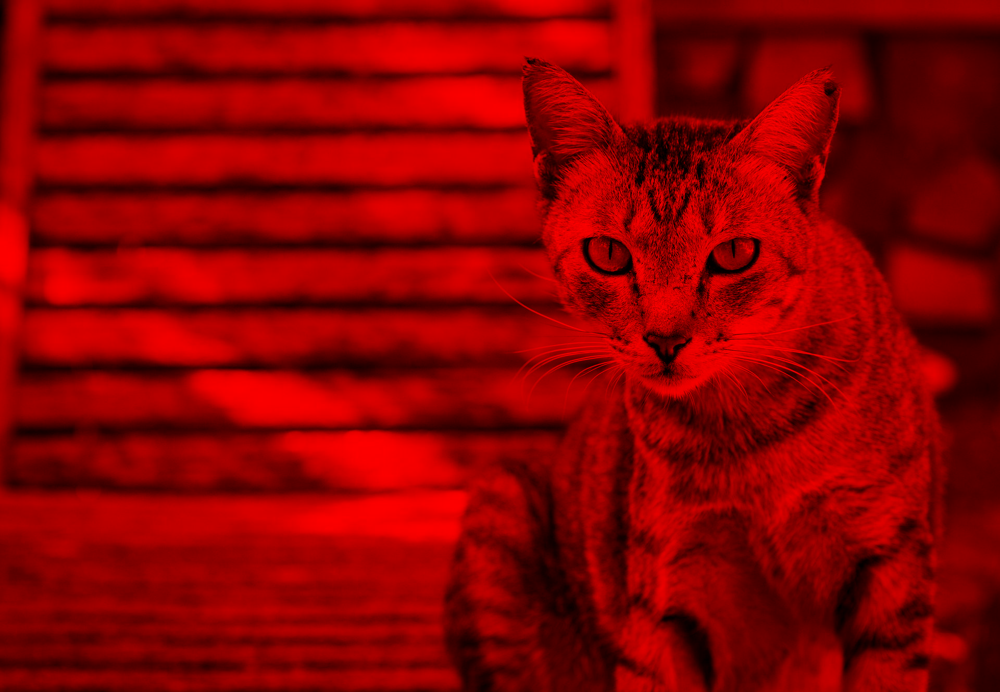

In [ ]:
cv2_imshow(r)

In [ ]:
url = 'https://datacarpentry.org/image-processing/data/plant-seedling.jpg'

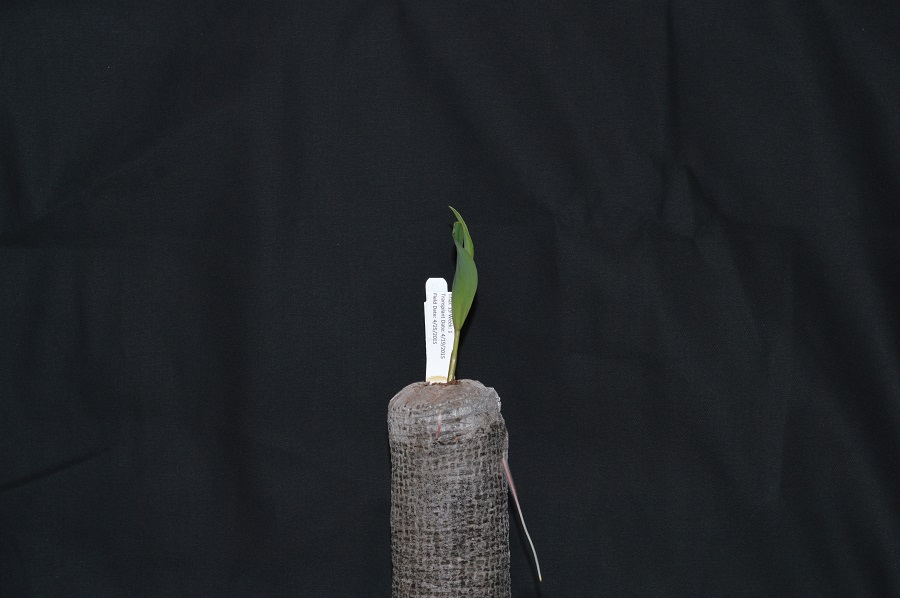

In [ ]:
image = io.imread(url)
image_4 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_4)

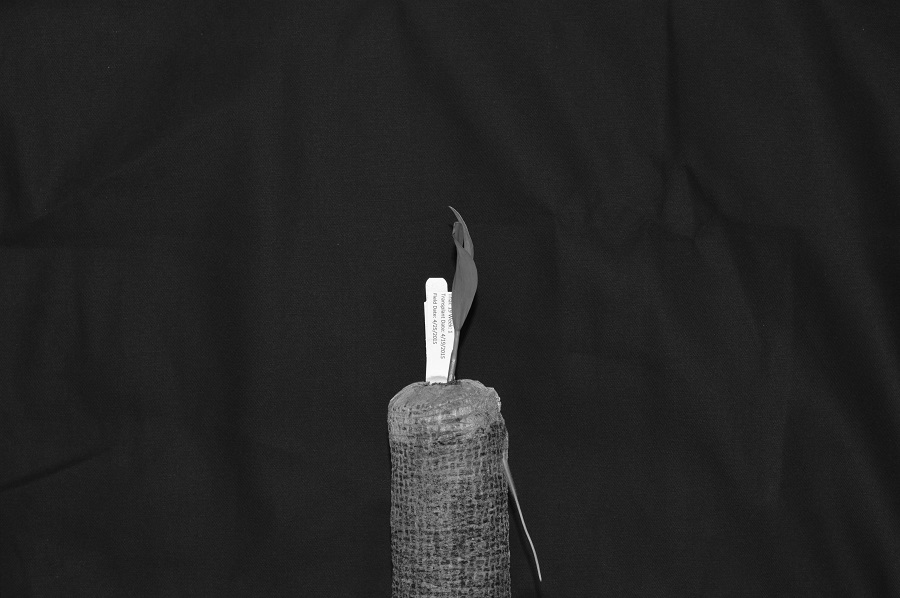

In [ ]:
image_4 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(image_4)

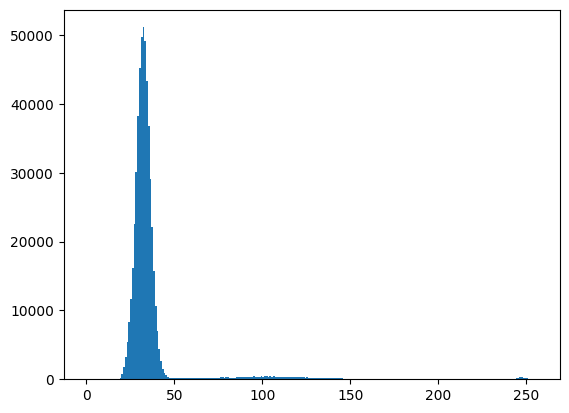

In [ ]:
plt.hist(image_4.ravel(), 256, [0, 256])
plt.show()

In [ ]:
image_4

array([[26, 25, 22, ..., 25, 25, 25],
       [25, 25, 23, ..., 26, 25, 25],
       [25, 26, 25, ..., 27, 26, 25],
       ...,
       [21, 26, 27, ..., 30, 24, 32],
       [22, 26, 26, ..., 29, 24, 30],
       [23, 26, 25, ..., 23, 31, 24]], dtype=uint8)

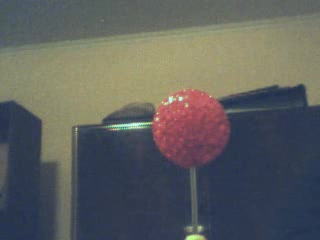

In [ ]:
url = 'http://mechanoid.su/content/cv-base.html/pix/ball2.jpg'
image = io.imread(url)
image_6 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_6)

In [ ]:
#autolevels
def autolevels(img):
  min = np.min(img)
  max = np.max(img)
  new_img = (img - min)/(255/(max-min))
  return new_img

In [ ]:
image_6_auto = autolevels(image_6)


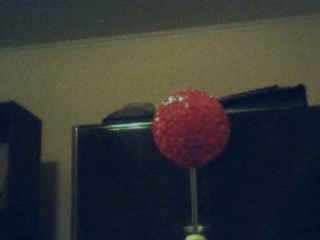

In [ ]:
cv2_imshow(image_6_auto)

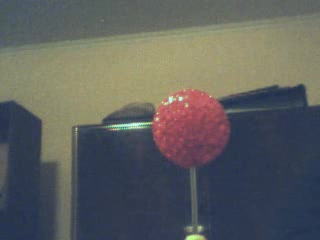

In [ ]:
image_6 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_6)

In [ ]:
image_6_auto = autolevels(image_6)

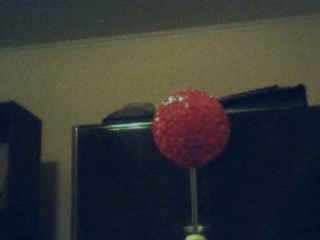

In [ ]:
cv2_imshow(image_6_auto)

In [ ]:
def gamma(img, gamma):
    return (img / 255.0) ** gamma * 255
gamma_img = gamma(image_6, 0.5)

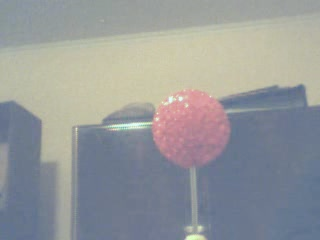

In [ ]:
cv2_imshow(gamma_img)

In [ ]:
gamma2 = gamma(image_6, 3)

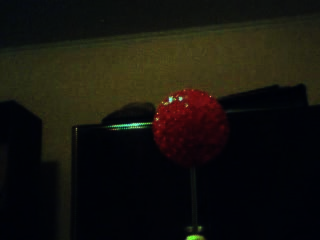

In [ ]:
cv2_imshow(gamma2)

With the use of open CV library make the next changes on the image
<br> + make binary image:
<br> + blurring
<br> + edge detection (https://en.wikipedia.org/wiki/Edge_detection)
<bt> + image rotation
<br> + image scalling
<br> + 3 more options not listed in this notebook

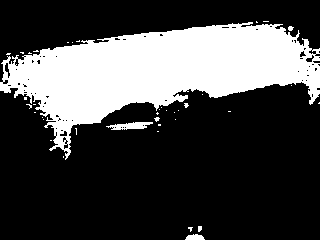

In [ ]:
# make binary image
# src: https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
image_v1 = io.imread(url)
gray_image_v1 = cv.cvtColor(image_v1, cv.COLOR_BGR2GRAY)
_, binary_image = cv.threshold(gray_image_v1, 127, 255, cv.THRESH_BINARY)
cv2_imshow(binary_image)

Blurred image


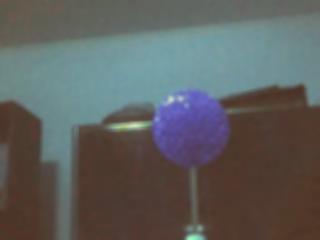

original Image


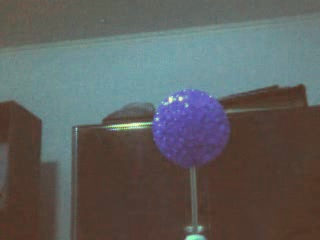

In [ ]:
# blurring
# src: https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html
blured_image = cv.blur(image_v1, (5,5))
cv.blur
print("Blurred image")
cv2_imshow(blured_image)
print("original Image")
cv2_imshow(image_v1)

Edge detection


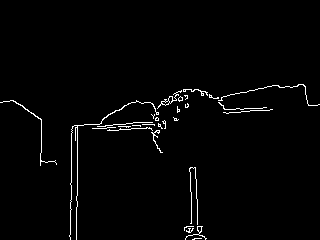

Rotated edge detection


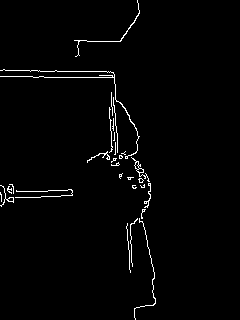

In [ ]:
# edge detection (https://en.wikipedia.org/wiki/Edge_detection) + image rotation
# src: https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html
edges = cv.Canny(gray_image_v1, 50, 150)
rotate_edges = cv.rotate(edges, cv.ROTATE_90_CLOCKWISE)
print('Edge detection')
cv2_imshow(edges)
print('Rotated edge detection')
cv2_imshow(rotate_edges)

original


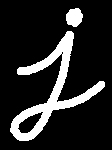

erosin


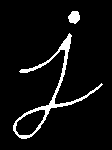

In [ ]:
# 3 more options not listed in this notebook
# src: https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html
image_v2 = io.imread('https://docs.opencv.org/4.x/j.png')
image_rgb = cv.cvtColor(image_v2, cv.COLOR_BGR2RGB)
print('original')
cv2_imshow(image_rgb)
kernel = np.ones((5,5),np.uint8)
print('erosin')
erosion = cv.erode(image_rgb,kernel,iterations = 1)
cv2_imshow(erosion)

scaled image


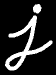

In [ ]:
# src: https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html
print('scaled image')
scale_factor = 0.5
scale_image = cv.resize(image_rgb, None, fx=scale_factor, fy=scale_factor)
cv2_imshow(scale_image)

orginial


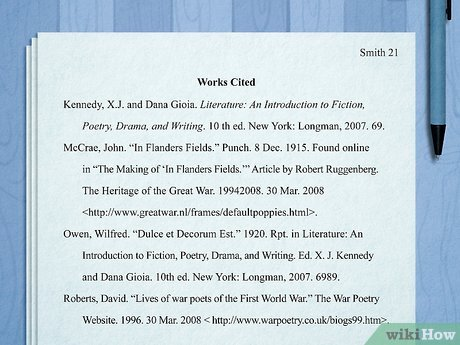

laplacian


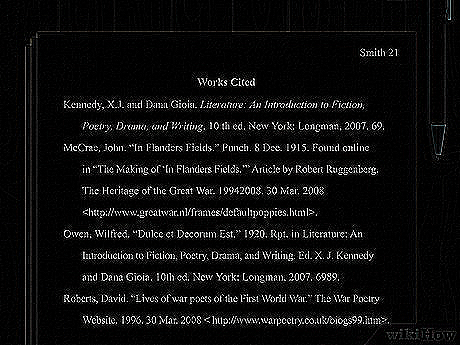

sobelx


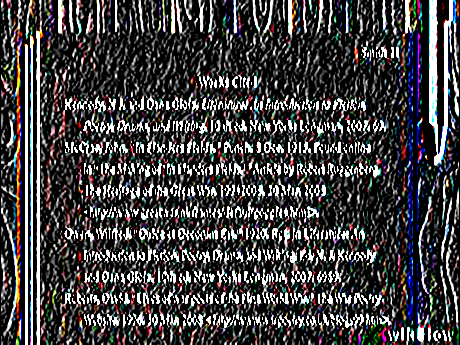

sobely


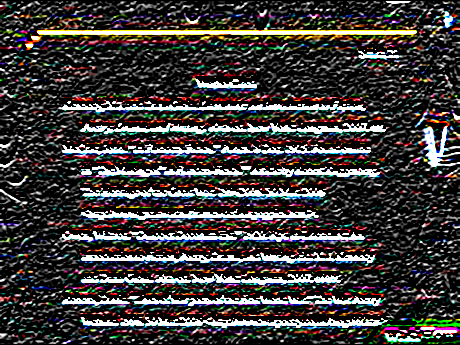

In [97]:
# src: https://docs.opencv.org/4.x/d5/d0f/tutorial_py_gradients.html
paper_image = io.imread('https://www.wikihow.com/images/thumb/0/00/Write-a-Paper-Step-13.jpg/v4-460px-Write-a-Paper-Step-13.jpg', cv.IMREAD_GRAYSCALE)
laplacian = cv.Laplacian(paper_image, cv.CV_64F)
sobelx = cv.Sobel(paper_image, cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(paper_image, cv.CV_64F,0,1,ksize=5)
print('orginial')
cv2_imshow(paper_image)
print('laplacian')
cv2_imshow(laplacian)
print('sobelx')
cv2_imshow(sobelx)
print('sobely')
cv2_imshow(sobely)